In [1]:
#Libraries - basic
import numpy as np
import pandas as pd
import matplotlib
from matplotlib import pyplot as plt
matplotlib.rcParams["figure.figsize"] = (20,10)
import seaborn as sns
import missingno as msno #Heatmap
import warnings
warnings.filterwarnings('ignore')

#Scikitlearn
import sklearn
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import RandomizedSearchCV

from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor


#ANN
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU,PReLU,ELU
from keras.layers import Dropout

import pickle
pd.set_option('display.max_rows', None)

In [2]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [3]:
prices_df=pd.read_csv('Bengaluru_House_Data.csv')
prices_df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [4]:
print(f'shape: {prices_df.shape}\n\ndescription: {prices_df.describe()}\n\n columns:\n{prices_df.columns}')

shape: (13320, 9)

description:                bath       balcony         price
count  13247.000000  12711.000000  13320.000000
mean       2.692610      1.584376    112.565627
std        1.341458      0.817263    148.971674
min        1.000000      0.000000      8.000000
25%        2.000000      1.000000     50.000000
50%        2.000000      2.000000     72.000000
75%        3.000000      2.000000    120.000000
max       40.000000      3.000000   3600.000000

 columns:
Index(['area_type', 'availability', 'location', 'size', 'society',
       'total_sqft', 'bath', 'balcony', 'price'],
      dtype='object')


In [5]:
prices_df.loc[:, prices_df.isnull().any()].count()


location    13319
size        13304
society      7818
bath        13247
balcony     12711
dtype: int64

<Axes: >

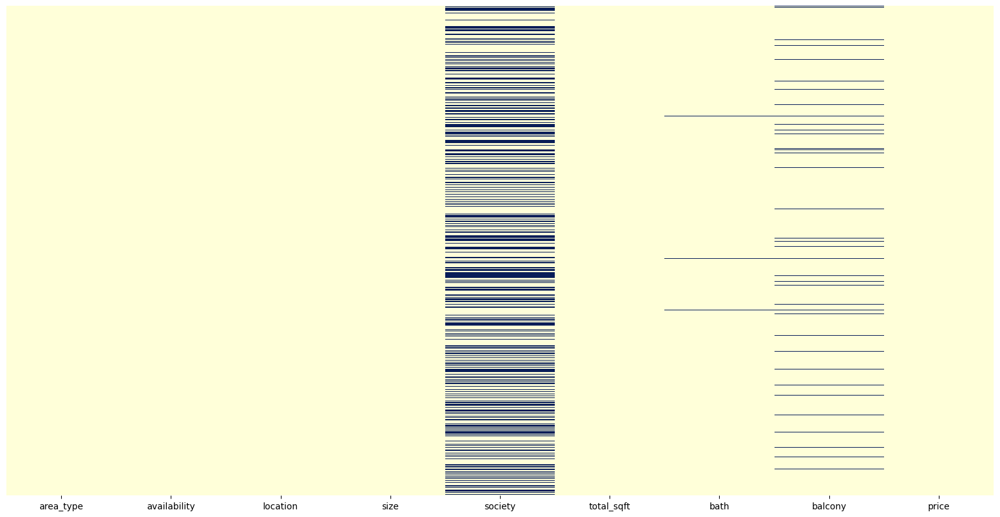

In [6]:
sns.heatmap(prices_df.isnull(),yticklabels=False,cbar=False,cmap='YlGnBu')


In [7]:
prices_df.drop(["area_type", "society","balcony", "availability"], axis = 1,inplace=True)


In [8]:
prices_df

,location,size,total_sqft,bath,price
0,Electronic City Phase II,2 BHK,1056,2.0,39.070
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.000
2,Uttarahalli,3 BHK,1440,2.0,62.000
3,Lingadheeranahalli,3 BHK,1521,3.0,95.000
4,Kothanur,2 BHK,1200,2.0,51.000
5,Whitefield,2 BHK,1170,2.0,38.000
6,Old Airport Road,4 BHK,2732,4.0,204.000
7,Rajaji Nagar,4 BHK,3300,4.0,600.000
8,Marathahalli,3 BHK,1310,3.0,63.250
9,Gandhi Bazar,6 Bedroom,1020,6.0,370.000


In [9]:
prices_df.shape


(13320, 5)

In [10]:
prices_df.loc[:, prices_df.isnull().any()].count()


location    13319
size        13304
bath        13247
dtype: int64

In [11]:
prices_df = prices_df.dropna()
print(f'NULL values: {prices_df.loc[:, prices_df.isnull().any()].count()}, shape: {prices_df.shape}')


NULL values: Series([], dtype: int64), shape: (13246, 5)


In [12]:
prices_df["size"].unique()


array(['2 BHK', '4 Bedroom', '3 BHK', '4 BHK', '6 Bedroom', '3 Bedroom',
       '1 BHK', '1 RK', '1 Bedroom', '8 Bedroom', '2 Bedroom',
       '7 Bedroom', '5 BHK', '7 BHK', '6 BHK', '5 Bedroom', '11 BHK',
       '9 BHK', '9 Bedroom', '27 BHK', '10 Bedroom', '11 Bedroom',
       '10 BHK', '19 BHK', '16 BHK', '43 Bedroom', '14 BHK', '8 BHK',
       '12 Bedroom', '13 BHK', '18 Bedroom'], dtype=object)

In [13]:
#BHK column refers to "Bedrooms/ Hall/ Kitchen"
prices_df['BHK'] = prices_df["size"].apply(lambda x: int(x.split(" ")[0]))

In [14]:
prices_df

,location,size,total_sqft,bath,price,BHK
0,Electronic City Phase II,2 BHK,1056,2.0,39.070,2
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.000,4
2,Uttarahalli,3 BHK,1440,2.0,62.000,3
3,Lingadheeranahalli,3 BHK,1521,3.0,95.000,3
4,Kothanur,2 BHK,1200,2.0,51.000,2
5,Whitefield,2 BHK,1170,2.0,38.000,2
6,Old Airport Road,4 BHK,2732,4.0,204.000,4
7,Rajaji Nagar,4 BHK,3300,4.0,600.000,4
8,Marathahalli,3 BHK,1310,3.0,63.250,3
9,Gandhi Bazar,6 Bedroom,1020,6.0,370.000,6


In [15]:
print(prices_df.head())
print(f'Numbers of unique BHK: {sorted(prices_df.BHK.unique())}')


                   location       size total_sqft  bath   price  BHK
0  Electronic City Phase II      2 BHK       1056   2.0   39.07    2
1          Chikka Tirupathi  4 Bedroom       2600   5.0  120.00    4
2               Uttarahalli      3 BHK       1440   2.0   62.00    3
3        Lingadheeranahalli      3 BHK       1521   3.0   95.00    3
4                  Kothanur      2 BHK       1200   2.0   51.00    2
Numbers of unique BHK: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 16, 18, 19, 27, 43]


In [16]:
def is_float(x):
    try:
        float(x)
    except:
        return False
    return True


In [17]:
prices_df[~prices_df['total_sqft'].apply(is_float)].head(10)


,location,size,total_sqft,bath,price,BHK
30,Yelahanka,4 BHK,2100 - 2850,4.0,186.000,4
122,Hebbal,4 BHK,3067 - 8156,4.0,477.000,4
137,8th Phase JP Nagar,2 BHK,1042 - 1105,2.0,54.005,2
165,Sarjapur,2 BHK,1145 - 1340,2.0,43.490,2
188,KR Puram,2 BHK,1015 - 1540,2.0,56.800,2
410,Kengeri,1 BHK,34.46Sq. Meter,1.0,18.500,1
549,Hennur Road,2 BHK,1195 - 1440,2.0,63.770,2
648,Arekere,9 Bedroom,4125Perch,9.0,265.000,9
661,Yelahanka,2 BHK,1120 - 1145,2.0,48.130,2
672,Bettahalsoor,4 Bedroom,3090 - 5002,4.0,445.000,4


In [18]:
# This function takes the col's values as an argument and returns the mean
def convert_sqft_to_number(x):
    tokens = x.split("-")
    if len(tokens) == 2:
        return (float(tokens[0])+float(tokens[1]))/2
    try:
        return float(x)
    except:
        return None


In [19]:
prices_df["total_sqft"] = prices_df["total_sqft"].apply(convert_sqft_to_number)


In [20]:
print(f'{prices_df.loc[30]}, {prices_df.loc[410]}')


location      Yelahanka
size              4 BHK
total_sqft       2475.0
bath                4.0
price             186.0
BHK                   4
Name: 30, dtype: object, location      Kengeri
size            1 BHK
total_sqft        NaN
bath              1.0
price            18.5
BHK                 1
Name: 410, dtype: object


In [21]:
# Creating a new feature considering that prices in Rupee
# We created this feature to have an wide observation about the outliers
prices_df["price_per_sqft"] = prices_df["price"]*100000/prices_df["total_sqft"]
prices_df.head()

,location,size,total_sqft,bath,price,BHK,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250.000000


In [22]:
# here we apply lambda to strip any leading or trailing whitespaces in the 'location' column 
# of the DataFrame 'prices_df' before computing the value counts.
prices_df['location'] = prices_df['location'].apply(lambda x: x.strip())
location_stats = prices_df['location'].value_counts(ascending=False)
print(location_stats)

Whitefield                                            535
Sarjapur  Road                                        392
Electronic City                                       304
Kanakpura Road                                        266
Thanisandra                                           236
Yelahanka                                             210
Uttarahalli                                           186
Hebbal                                                176
Marathahalli                                          175
Raja Rajeshwari Nagar                                 171
Bannerghatta Road                                     152
Hennur Road                                           150
7th Phase JP Nagar                                    149
Haralur Road                                          141
Electronic City Phase II                              131
Rajaji Nagar                                          106
Chandapura                                             98
Bellandur     

In [23]:
print(f'The length of the location_stats feature is: {len(location_stats)} ')


The length of the location_stats feature is: 1293 


In [24]:
len(location_stats[location_stats<=10])


1052

In [25]:
location_stats_less_than_10 = location_stats[location_stats<=10]
print(location_stats_less_than_10)

Naganathapura                                         10
Sadashiva Nagar                                       10
Nagappa Reddy Layout                                  10
BTM 1st Stage                                         10
Sector 1 HSR Layout                                   10
Basapura                                              10
Ganga Nagar                                           10
Dairy Circle                                          10
Kalkere                                               10
1st Block Koramangala                                 10
Dodsworth Layout                                      10
Nagadevanahalli                                       10
Gunjur Palya                                          10
2nd Phase JP Nagar                                     9
KUDLU MAIN ROAD                                        9
4th Block Koramangala                                  9
Vignana Nagar                                          9
Ejipura                        

In [26]:
prices_df['location']=prices_df['location'].apply(lambda x: 'other' if x in location_stats_less_than_10 else x)
len(prices_df['location'].unique())

242

In [27]:
prices_df.head()


,location,size,total_sqft,bath,price,BHK,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,51.00,2,4250.000000


In [28]:
print(f"{prices_df[(prices_df['total_sqft']/prices_df['BHK'])<300].head()}\n\n{len(prices_df[(prices_df['total_sqft']/prices_df['BHK'])<300])}")

               location       size  total_sqft  bath  price  BHK  \
9                 other  6 Bedroom      1020.0   6.0  370.0    6   
45           HSR Layout  8 Bedroom       600.0   9.0  200.0    8   
58        Murugeshpalya  6 Bedroom      1407.0   4.0  150.0    6   
68  Devarachikkanahalli  8 Bedroom      1350.0   7.0   85.0    8   
70                other  3 Bedroom       500.0   3.0  100.0    3   

    price_per_sqft  
9     36274.509804  
45    33333.333333  
58    10660.980810  
68     6296.296296  
70    20000.000000  

744


In [29]:
# Through this feature we observer that the max value is so high
print(prices_df['price_per_sqft'].describe())
print(f'\n\n{prices_df.shape}')

count    1.320000e+04
mean     7.920759e+03
std      1.067272e+05
min      2.678298e+02
25%      4.267701e+03
50%      5.438331e+03
75%      7.317073e+03
max      1.200000e+07
Name: price_per_sqft, dtype: float64


(13246, 7)


In [30]:
# Thus we try to remove outliers using mean and std values
def remove_outliers(df):
    df_output = pd.DataFrame()
    for key, sub_df in df.groupby('location'):
        mean = np.mean(sub_df['price_per_sqft'])
        std = np.std(sub_df['price_per_sqft'])
        reduced_df = sub_df[(sub_df['price_per_sqft']>(mean-std)) & (sub_df['price_per_sqft']<=(mean+std))]
        df_output = pd.concat([df_output,reduced_df],ignore_index=True)
    return df_output
prices_df = remove_outliers(prices_df)
prices_df.shape

(11428, 7)

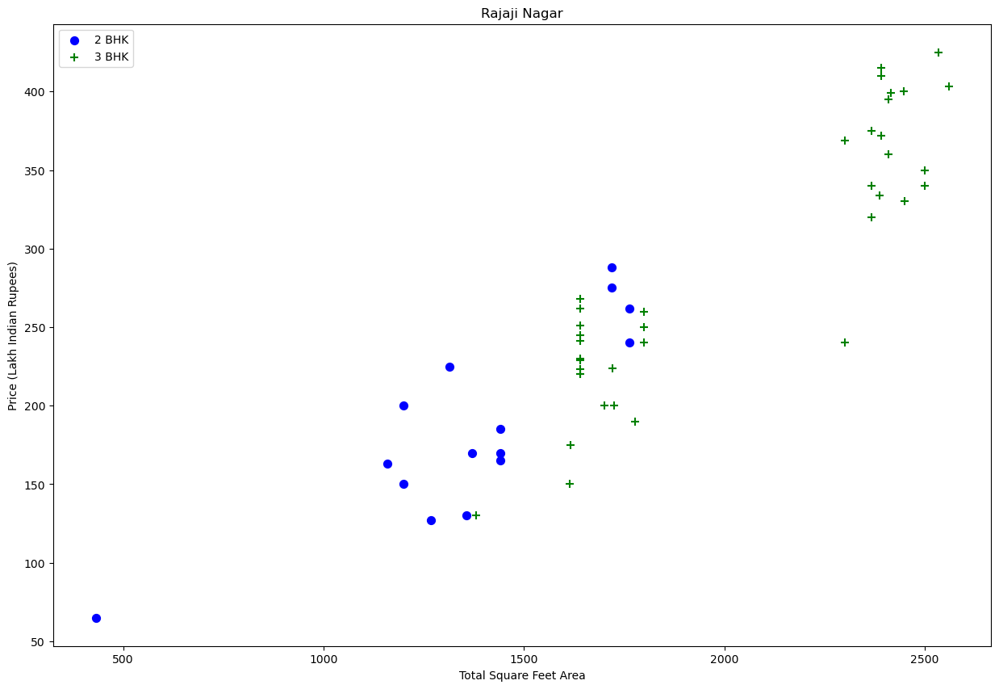

In [31]:
def plot_scatter_chart(df,location):
    bhk2 = df[(df.location==location) & (df.BHK==2)]
    bhk3 = df[(df.location==location) & (df.BHK==3)]
    matplotlib.rcParams['figure.figsize'] = (15,10)
    plt.scatter(bhk2.total_sqft,bhk2.price,color='blue',label='2 BHK', s=50)
    plt.scatter(bhk3.total_sqft,bhk3.price,marker='+', color='green',label='3 BHK', s=50)
    plt.xlabel("Total Square Feet Area")
    plt.ylabel("Price (Lakh Indian Rupees)")
    plt.title(location)
    plt.legend()

plot_scatter_chart(prices_df,"Rajaji Nagar")

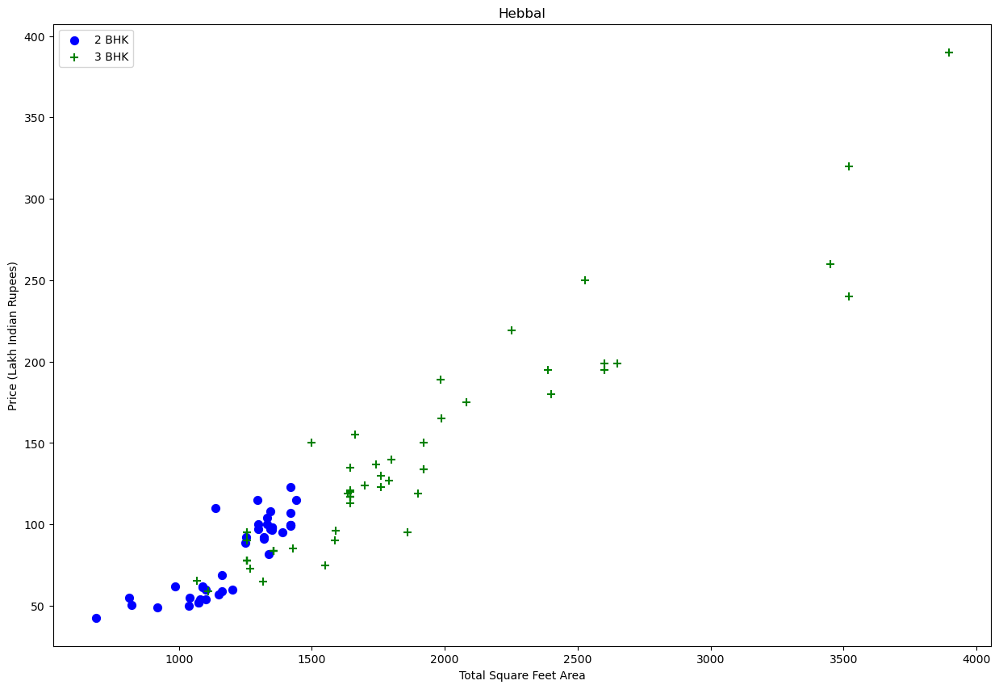

In [32]:
plot_scatter_chart(prices_df,"Hebbal")


In [33]:
# This function removes the BHK houses if they are below BHK-1 mean 
def remove_bhk_outliers(df):
    exclude_indices = np.array([])

    for location, location_df in df.groupby('location'):
        bhk_stats = {}

        for bhk, bhk_df in location_df.groupby('bhk'):
            bhk_stats[bhk] = \
            {
                'mean': np.mean(bhk_df.price_per_sqft),
                'std': np.std(bhk_df.price_per_sqft),
                'count': bhk_df.shape[0]
            }

        for bhk, bhk_df in location_df.groupby('bhk'):
            stats = bhk_stats.get(bhk-1)
            
            if stats and stats['count']>5:
                exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)

    return df.drop(exclude_indices,axis='index')

In [34]:
print(prices_df.shape)
prices_df=remove_outliers(prices_df)
print(prices_df.shape)

(11428, 7)
(8333, 7)


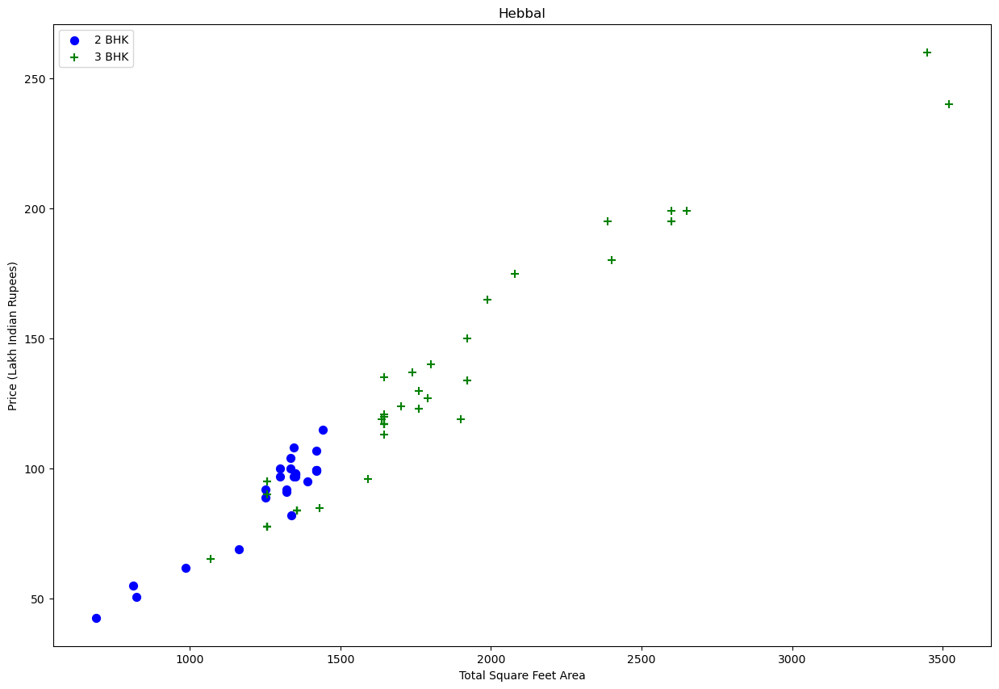

In [35]:
plot_scatter_chart(prices_df,"Hebbal")


Text(0, 0.5, 'Count')

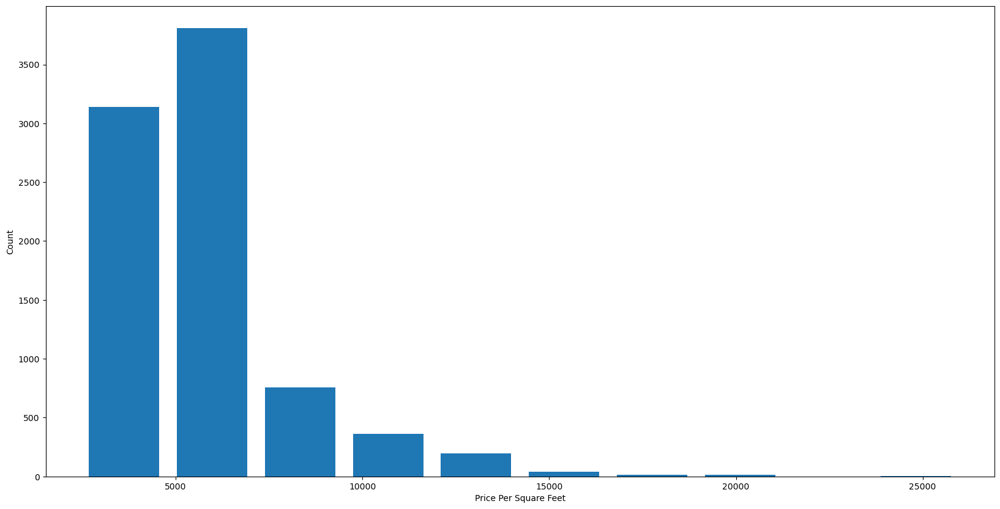

In [36]:
matplotlib.rcParams["figure.figsize"] = (20,10)
plt.hist(prices_df['price_per_sqft'],rwidth=0.8)
plt.xlabel("Price Per Square Feet")
plt.ylabel("Count")

In [37]:
# Checking number of bathrooms
print(sorted(prices_df['bath'].unique()))

[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 12.0, 13.0, 15.0, 16.0, 27.0]


In [38]:
print(prices_df.shape)
prices_df=prices_df[prices_df['bath']<prices_df['BHK']+2]
print(prices_df.shape)

(8333, 7)
(8255, 7)


In [39]:
prices_df.drop(['size','price_per_sqft'],axis='columns',inplace=True)
prices_df.head()

,location,total_sqft,bath,price,BHK
0,1st Block Jayanagar,1630.0,3.0,194.0,3
1,1st Block Jayanagar,1875.0,2.0,235.0,3
2,1st Block Jayanagar,1200.0,2.0,130.0,3
3,1st Block Jayanagar,1235.0,2.0,148.0,2
4,1st Phase JP Nagar,2825.0,4.0,250.0,4


In [40]:
#Onehot_encoding
def onehot_encoding(final_df,cat_columns):
    encoded_df=final_df
    i=0
    for column in cat_columns:
        print(column)
        df1=pd.get_dummies(final_df[column],drop_first=True)
        final_df.drop([column],axis=1,inplace=True)
        if i==0:
             encoded_df=df1.copy()
        else:     
             encoded_df=pd.concat([ encoded_df,df1],axis=1)
        i=i+1
       
    encoded_df=pd.concat([final_df, encoded_df],axis=1)
        
    return encoded_df

In [41]:
prices_df=onehot_encoding(prices_df,['location'])


location


In [42]:
prices_df=prices_df.loc[:,~prices_df.columns.duplicated()] #Remove duplicated columns


In [43]:
prices_df.head()


,total_sqft,bath,price,BHK,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,6th Phase JP Nagar,...,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur,other
0,1630.0,3.0,194.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1875.0,2.0,235.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1200.0,2.0,130.0,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1235.0,2.0,148.0,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2825.0,4.0,250.0,4,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [44]:
X = prices_df.drop(['price'],axis='columns')
y = prices_df['price']

In [45]:
X

,total_sqft,bath,BHK,1st Phase JP Nagar,2nd Phase Judicial Layout,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,6th Phase JP Nagar,7th Phase JP Nagar,...,Vishveshwarya Layout,Vishwapriya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yelenahalli,Yeshwanthpur,other
0,1630.000,3.0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1875.000,2.0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1200.000,2.0,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1235.000,2.0,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2825.000,4.0,4,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1875.000,3.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,2024.000,3.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1394.000,2.0,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,1077.000,2.0,2,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,1590.000,3.0,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [46]:
y

0        194.000
1        235.000
2        130.000
3        148.000
4        250.000
5        167.000
6        157.000
7        100.000
8         93.000
9        131.000
10       210.000
11        88.500
12        86.000
13       175.000
14        85.000
15       222.000
16        75.000
17        50.750
18        40.250
19        47.250
20        47.250
21        47.250
22        40.250
24       240.000
25        95.000
26       100.000
27       225.000
28       240.000
29       240.000
30       240.000
31       240.000
32       230.000
33       233.000
34       240.000
35        70.000
36       205.000
37       205.000
38       300.000
39       205.000
40        60.000
41        52.500
42        62.800
43        63.000
44       100.000
45        60.000
46       100.000
47        67.000
48       110.000
49        30.000
50        65.000
51        62.800
52        48.000
53        75.000
54        23.500
55        51.000
56        60.000
57        75.000
58        66.000
59        57.0

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)


In [48]:
X_train.shape


(6604, 244)

In [49]:
X_test.shape

(1651, 244)

In [50]:
y_train.shape

(6604,)

In [51]:
y_test.shape

(1651,)

In [52]:
# Define the models and their hyperparameters
model_params = {
    'xgb_regressor' : {
        'model': XGBRegressor(),
        'params':{
            'objective':['reg:squarederror'],
            'n_estimators': [100, 900, 1500],
            'max_depth':[2, 3, 5, 10, 15],
            'learning_rate':[0.025,0.1,0.15,0.20],
            'min_child_weight':[1,2,3,4],
            'booster':['gbtree','gblinear'],
            'base_score':[0.25,0.5,0.75,1]
        }
    },
    'random_forest': {
        'model': RandomForestRegressor(),
        'params': {
            'n_estimators': [10, 50, 100],
            'max_depth': [None, 10, 20],
            'min_samples_split': [2, 5, 10]
        }
    },
    'linear_regression': {
        'model': LinearRegression(),
        'params': {
            'normalize': [True, False]
        }
    },
    'decision_tree': {
        'model': DecisionTreeRegressor(),
        'params': {
            'criterion': ['mse', 'friedman_mse'],
            'splitter': ['best', 'random'],
            'max_depth': [None, 10, 20]
        }
    },
    'lasso': {
        'model': Lasso(),
        'params': {
            'alpha': [1,2],
            'selection': ['random', 'cyclic']
        }
    }
}

# Run a grid search to find the best hyperparameters for each model
best_scores = []
for model_name, mp in model_params.items():
    clf = RandomizedSearchCV(mp['model'], mp['params'], cv=5, random_state=42)
    clf.fit(X_train, y_train)
    best_scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })

# Find the best algorithm
best_model_name = max(best_scores, key=lambda x: x['best_score'])['model']
print("Best algorithm:", best_model_name)

# Get the best model object and its parameters
best_model = model_params[best_model_name]['model']
best_params = next(item for item in best_scores if item['model'] == best_model_name)['best_params']

# Fit the best algorithm into the pipeline
steps = [('imputer', SimpleImputer()), 
         ('scaler', StandardScaler()), 
         (best_model_name, best_model.set_params(**best_params))]

pipeline = Pipeline(steps)

pipeline.fit(X_train, y_train)

# Fit the pipeline and compute its evaluation metric
if best_model_name == 'linear_regression':
    predictions = pipeline.predict(X_test)
    mse = mean_squared_error(y_test, predictions)
    print("MSE:", mse)
else:
    score = pipeline.score(X_test, y_test)
    print("Score:", score)


[14:03:14] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[14:03:17] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[14:03:20] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[14:03:22] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[14:03:25] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[14:03:29] WARNING: C:\Users\dev-admin\croot2\xgboost-split_1675461376218\work\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[14:03:31] WARNING: C:

In [53]:
# Initialising the Artifical Neural Network
classifier = Sequential()

# Adding the input layer and the first hidden layer
classifier.add(Dense(50, kernel_initializer = 'he_uniform',activation='relu',input_dim = 244))

# Adding the second hidden layer
classifier.add(Dense(50, kernel_initializer = 'he_uniform',activation='relu'))

# Adding the third hidden layer
classifier.add(Dense(50, kernel_initializer = 'he_uniform',activation='relu'))
# Adding the output layer
classifier.add(Dense(1, kernel_initializer = 'he_uniform'))

# Compiling the ANN
classifier.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer='Adamax')

# Fitting the ANN to the Training set
model_history=classifier.fit(X_train.values, y_train.values,validation_split=0.20, batch_size = 10, epochs = 500)



Epoch 1/500

529/529 [==============================] - 3s 3ms/step - loss: 2124.7705 - val_loss: 1600.8762
Epoch 2/500
529/529 [==============================] - 1s 2ms/step - loss: 1961.2947 - val_loss: 1574.3937
Epoch 3/500
529/529 [==============================] - 1s 2ms/step - loss: 1928.4331 - val_loss: 1567.8031
Epoch 4/500
529/529 [==============================] - 1s 2ms/step - loss: 1999.4775 - val_loss: 1600.1582
Epoch 5/500
529/529 [==============================] - 1s 2ms/step - loss: 1944.7791 - val_loss: 1605.6633
Epoch 6/500
529/529 [==============================] - 1s 2ms/step - loss: 1949.0447 - val_loss: 1551.2229
Epoch 7/500
529/529 [==============================] - 1s 2ms/step - loss: 1944.8322 - val_loss: 1605.7410
Epoch 8/500
529/529 [==============================] - 1s 2ms/step - loss: 1913.8861 - val_loss: 1547.8281
Epoch 9/500
529/529 [==============================] - 1s 2ms/step - loss: 1903.5441 - val_loss: 1548.5555
Epoch 10/500
529/529 [============

In [54]:
#Testing the model
def predict_price(classifier, location, sqft, bath, bhk):
    loc_index = np.where(X.columns==location)[0][0]

    x = np.zeros(len(X.columns))
    x[0] = sqft
    x[1] = bath
    x[2] = bhk
    if loc_index >= 0:
        x[loc_index] = 1

    # Reshape the array to (1, len(X.columns))
    x = x.reshape(1, -1)

    return classifier.predict(x)[0]

In [55]:
print(f'Best_algo prediciton:{predict_price(pipeline,"1st Phase JP Nagar",1000, 2, 2)}')
print(f'ANN prediciton:{predict_price(classifier,"1st Phase JP Nagar",1000, 2, 2)}')

Best_algo prediciton:91.46317348473679
1/1 [==============================] - 0s 103ms/step
ANN prediciton:[83.0944]


In [56]:
print(f'Best_algo prediciton:{predict_price(pipeline,"Indira Nagar",1000, 3, 3)}')
print(f'ANN prediciton:{predict_price(classifier,"Indira Nagar",1000, 3, 3)}')

Best_algo prediciton:145.4609924475464
1/1 [==============================] - 0s 25ms/step
ANN prediciton:[126.512474]


In [57]:
with open('banglore_home_prices_model.pickle','wb') as f:
    pickle.dump(classifier,f)

In [58]:
import json
columns = {
    'data_columns' : [col.lower() for col in X.columns]
}
with open("columns.json","w") as f:
    f.write(json.dumps(columns))